# Project: Investigating European Soccer Database

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id='intro'></a>
## Introduction

This database comes from Kaggle. It contains data for soccer matches, players, and teams from several European countries from 2008 to 2016.

In this investigation we are going to try to answer these questions:

<a href='#q1'>  1- What teams improved the most over the time period?</a><br>
<a href='#q1'>  2- Which players had the most penalties?</a><br>
<a href='#q1'>  3- What team attributes lead to the most victories?</a><br>

In [1]:
import numpy as np
import pandas as pd
import sqlite3 as sql
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


<a id='wrangling'></a>
# Data Wrangling

I have explored the database using db browser,
 
It contains 7 tables: Country, League, Match, Player, Player_Attributes, Team, Team_Attributes.

Let's load all tables from the database and save them in dataframes.


In [9]:
# !pip install wget
import wget

wget.download('https://d17h27t6h515a5.cloudfront.net/topher/2017/November/5a0a4cad_database/database.sqlite')

'database (1).sqlite'

In [2]:
# I have explored the database using db browser,
# It contains 7 tables: Country, League, Match, Player, Player_Attributes, Team, Team_Attributes
# Let's load all tables from the database and save them in dataframes

# Connecting the database
conn = sql.connect("database.sqlite")

# Create a function to load table from the database into a dataframe
def sql_to_df(table):
    teams_query= f""" select * from {table}"""
    return pd.read_sql_query(teams_query,conn)

# Save tables in dataframes
table_names = ['Country', 'League', 'Match', 'Player', 'Player_Attributes', 'Team', 'Team_Attributes']
Country, League, Match, Player, Player_Attributes, Team, Team_Attributes = list(map(sql_to_df, table_names))

## Exploring all dataframes contents

In [3]:
Country

,id,name
0,1,Belgium
1,1729,England
2,4769,France
3,7809,Germany
4,10257,Italy
5,13274,Netherlands
6,15722,Poland
7,17642,Portugal
8,19694,Scotland
9,21518,Spain


In [4]:
League.head()

,id,country_id,name
0,1,1,Belgium Jupiler League
1,1729,1729,England Premier League
2,4769,4769,France Ligue 1
3,7809,7809,Germany 1. Bundesliga
4,10257,10257,Italy Serie A


In [5]:
Player

,id,player_api_id,player_name,player_fifa_api_id,birthday,height,weight
0,1,505942,Aaron Appindangoye,218353,1992-02-29 00:00:00,182.88,187
1,2,155782,Aaron Cresswell,189615,1989-12-15 00:00:00,170.18,146
2,3,162549,Aaron Doran,186170,1991-05-13 00:00:00,170.18,163
3,4,30572,Aaron Galindo,140161,1982-05-08 00:00:00,182.88,198
4,5,23780,Aaron Hughes,17725,1979-11-08 00:00:00,182.88,154
...,...,...,...,...,...,...,...
11055,11071,26357,Zoumana Camara,2488,1979-04-03 00:00:00,182.88,168
11056,11072,111182,Zsolt Laczko,164680,1986-12-18 00:00:00,182.88,176
11057,11073,36491,Zsolt Low,111191,1979-04-29 00:00:00,180.34,154
11058,11074,35506,Zurab Khizanishvili,47058,1981-10-06 00:00:00,185.42,172


In [6]:
Player_Attributes.head()

,id,player_fifa_api_id,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,1,218353,505942,2016-02-18 00:00:00,67.0,71.0,right,medium,medium,49.0,...,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0
1,2,218353,505942,2015-11-19 00:00:00,67.0,71.0,right,medium,medium,49.0,...,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0
2,3,218353,505942,2015-09-21 00:00:00,62.0,66.0,right,medium,medium,49.0,...,54.0,48.0,65.0,66.0,69.0,6.0,11.0,10.0,8.0,8.0
3,4,218353,505942,2015-03-20 00:00:00,61.0,65.0,right,medium,medium,48.0,...,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0
4,5,218353,505942,2007-02-22 00:00:00,61.0,65.0,right,medium,medium,48.0,...,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0


In [7]:
Team.head()

,id,team_api_id,team_fifa_api_id,team_long_name,team_short_name
0,1,9987,673.0,KRC Genk,GEN
1,2,9993,675.0,Beerschot AC,BAC
2,3,10000,15005.0,SV Zulte-Waregem,ZUL
3,4,9994,2007.0,Sporting Lokeren,LOK
4,5,9984,1750.0,KSV Cercle Brugge,CEB


In [8]:
Team_Attributes.head()

,id,team_fifa_api_id,team_api_id,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
0,1,434,9930,2010-02-22 00:00:00,60,Balanced,NaN,Little,50,Mixed,...,55,Normal,Organised,50,Medium,55,Press,45,Normal,Cover
1,2,434,9930,2014-09-19 00:00:00,52,Balanced,48.0,Normal,56,Mixed,...,64,Normal,Organised,47,Medium,44,Press,54,Normal,Cover
2,3,434,9930,2015-09-10 00:00:00,47,Balanced,41.0,Normal,54,Mixed,...,64,Normal,Organised,47,Medium,44,Press,54,Normal,Cover
3,4,77,8485,2010-02-22 00:00:00,70,Fast,NaN,Little,70,Long,...,70,Lots,Organised,60,Medium,70,Double,70,Wide,Cover
4,5,77,8485,2011-02-22 00:00:00,47,Balanced,NaN,Little,52,Mixed,...,52,Normal,Organised,47,Medium,47,Press,52,Normal,Cover


## Joining related tables

### Rename some columns to prevent confusion 


In [9]:
# Rename some columns to prevent confusion 
Country.columns = ['country_id', 'country_name']
League.columns = ['league_id',	'country_id', 'league_name']

### Joining Team, Country, League & Match dataframes into one df


In [10]:
# Join Team, Country, League & Match dataframes into one df
all_matches = pd.merge(pd.merge(League, Country, on='country_id'), Match, on=['league_id', 'country_id']).drop(columns=['league_id', 'country_id', 'id'])

# Replace home & away teams id columns in all_match dataframe with team names by joining with Team dataframe
teams_home = Team.rename(columns={'team_api_id' : 'home_team_api_id', 'team_long_name':'home_team_name'})[['home_team_api_id', 'home_team_name']]
teams_away = Team.rename(columns={'team_api_id' : 'away_team_api_id', 'team_long_name':'away_team_name'})[['away_team_api_id', 'away_team_name']]
all_matches = pd.merge(all_matches, teams_home, on='home_team_api_id')
all_matches = pd.merge(all_matches, teams_away, on='away_team_api_id')
all_matches.head()

,league_name,country_name,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,...,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,home_team_name,away_team_name
0,Belgium Jupiler League,Belgium,2008/2009,1,2008-08-17 00:00:00,492473,9987,9993,1,1,...,3.4,4.50,1.78,3.25,4.00,1.73,3.4,4.2,KRC Genk,Beerschot AC
1,Belgium Jupiler League,Belgium,2009/2010,5,2009-08-30 00:00:00,665353,9987,9993,1,1,...,3.3,4.00,1.90,3.25,3.75,1.83,3.3,3.8,KRC Genk,Beerschot AC
2,Belgium Jupiler League,Belgium,2010/2011,1,2010-08-01 00:00:00,838476,9987,9993,2,1,...,3.3,3.80,1.95,3.25,3.50,NaN,NaN,NaN,KRC Genk,Beerschot AC
3,Belgium Jupiler League,Belgium,2011/2012,1,2011-07-30 00:00:00,1032694,9987,9993,3,1,...,4.5,7.00,1.45,4.00,6.25,1.44,4.0,6.5,KRC Genk,Beerschot AC
4,Belgium Jupiler League,Belgium,2012/2013,11,2012-10-20 00:00:00,1224064,9987,9993,3,0,...,4.5,6.25,1.50,4.00,5.50,1.53,3.8,5.5,KRC Genk,Beerschot AC


In [11]:
# By exploring all_matches dataframe, I found a lot of unimportant column
# Selecting only needed columns
columns=['league_name', 'country_name', 'season', 'stage', 'date', 'match_api_id','home_team_name',	'away_team_name', 'home_team_goal', 'away_team_goal']
all_matches = all_matches[columns]

all_matches.head()

,league_name,country_name,season,stage,date,match_api_id,home_team_name,away_team_name,home_team_goal,away_team_goal
0,Belgium Jupiler League,Belgium,2008/2009,1,2008-08-17 00:00:00,492473,KRC Genk,Beerschot AC,1,1
1,Belgium Jupiler League,Belgium,2009/2010,5,2009-08-30 00:00:00,665353,KRC Genk,Beerschot AC,1,1
2,Belgium Jupiler League,Belgium,2010/2011,1,2010-08-01 00:00:00,838476,KRC Genk,Beerschot AC,2,1
3,Belgium Jupiler League,Belgium,2011/2012,1,2011-07-30 00:00:00,1032694,KRC Genk,Beerschot AC,3,1
4,Belgium Jupiler League,Belgium,2012/2013,11,2012-10-20 00:00:00,1224064,KRC Genk,Beerschot AC,3,0


### Joining Player & Player_Attributes dataframes into one dataframe and selecting needed columns

In [12]:
# Join Player & Player_Attributes dataframes into one df and selecting needed columns ('player_name' & 'penalties' )
df1 = Player[['player_api_id', 'player_name']]
df2 = Player_Attributes[['player_api_id', 'penalties', ]]
all_players = pd.merge(df1, df2, on='player_api_id').drop(columns='player_api_id')
all_players.head()

,player_name,penalties
0,Aaron Appindangoye,48.0
1,Aaron Appindangoye,48.0
2,Aaron Appindangoye,48.0
3,Aaron Appindangoye,47.0
4,Aaron Appindangoye,47.0


### # Joining Team & Team_Attributes dataframes into one dataframe and selecting needed columns

In [13]:
# Joining Team & Team_Attributes dataframes into one df
df1 = Team[['team_api_id', 'team_long_name', 'team_short_name']]
df2 = Team_Attributes.drop(columns=['id','team_fifa_api_id'])
all_teams = pd.merge(df1, df2, on='team_api_id').drop(columns='team_api_id')

all_teams.head()

,team_long_name,team_short_name,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,buildUpPlayPositioningClass,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
0,KRC Genk,GEN,2010-02-22 00:00:00,45,Balanced,NaN,Little,45,Mixed,Organised,...,60,Normal,Organised,70,High,65,Press,70,Wide,Cover
1,KRC Genk,GEN,2011-02-22 00:00:00,66,Balanced,NaN,Little,52,Mixed,Organised,...,51,Normal,Organised,48,Medium,47,Press,54,Normal,Offside Trap
2,KRC Genk,GEN,2012-02-22 00:00:00,53,Balanced,NaN,Little,55,Mixed,Organised,...,56,Normal,Organised,47,Medium,45,Press,55,Normal,Cover
3,KRC Genk,GEN,2013-09-20 00:00:00,58,Balanced,NaN,Little,38,Mixed,Organised,...,56,Normal,Organised,47,Medium,45,Press,55,Normal,Cover
4,KRC Genk,GEN,2014-09-19 00:00:00,58,Balanced,52.0,Normal,38,Mixed,Organised,...,56,Normal,Organised,47,Medium,45,Press,55,Normal,Cover


## Data Cleaning

### Now we joinrd all tables into three dataframes: all_teams, all_players, all_matches
### Let's clean them
### 1- Handling duplicates

In [14]:
# check for duplicates in all_teams
all_teams[all_teams.duplicated()]

,team_long_name,team_short_name,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,buildUpPlayPositioningClass,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
69,Royal Excel Mouscron,MOU,2015-09-10 00:00:00,50,Balanced,50.0,Normal,50,Mixed,Organised,...,50,Normal,Organised,45,Medium,45,Press,50,Normal,Cover


In [15]:
# There is only one duplicate in all_teams dataframe, let's drop it
all_teams = all_teams.drop_duplicates()
all_teams.duplicated().sum()

0

Check for duplicates in all_players dataframe


In [16]:
# Check for duplicates in all_players
all_players[all_players.duplicated()]


,player_name,penalties
1,Aaron Appindangoye,48.0
2,Aaron Appindangoye,48.0
4,Aaron Appindangoye,47.0
6,Aaron Cresswell,59.0
7,Aaron Cresswell,59.0
...,...,...
183969,Zvjezdan Misimovic,78.0
183970,Zvjezdan Misimovic,78.0
183972,Zvjezdan Misimovic,73.0
183975,Zvjezdan Misimovic,70.0


In [17]:
# Drop duplicates in all_players
all_players = all_players.drop_duplicates()

# Check the sum of duplicates after dropping all of them, it should be zero
all_players.duplicated().sum()

0

Check for duplicates in all_teams


In [18]:
# check for duplicates in all_teams
all_teams[all_teams.duplicated()]


,team_long_name,team_short_name,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,buildUpPlayPositioningClass,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass


In [19]:
# check for duplicates in all_matches
all_matches[all_matches.duplicated()]


,league_name,country_name,season,stage,date,match_api_id,home_team_name,away_team_name,home_team_goal,away_team_goal


So, no duplicates in all_matches or all_teams dataframes

### 2- Handling NAN values

Check for nulls in all_players dataframe


In [20]:
# check for nulls in all_players
all_players.isnull().sum()

player_name      0
penalties      755
dtype: int64

The null values in penalties means the player has never played a penalty and so his penalty attribute should be zero

Replacing nulls in penalties columns with zeros, meaning that the player has not played any penalty

In [21]:
# The null values in penalties means the player has never played a penalty and so his penalty attribute should be zero
# Replacing nulls in penalties columns with zeros
all_players = all_players.fillna(0)

# Check the sum of nulls after filling all of them, it should be zero
all_players.isnull().sum()

player_name    0
penalties      0
dtype: int64

Check for nulls in all_teams dataframe


In [22]:
# check for nulls in all_teams
all_teams.isnull().sum()

team_long_name                      0
team_short_name                     0
date                                0
buildUpPlaySpeed                    0
buildUpPlaySpeedClass               0
buildUpPlayDribbling              969
buildUpPlayDribblingClass           0
buildUpPlayPassing                  0
buildUpPlayPassingClass             0
buildUpPlayPositioningClass         0
chanceCreationPassing               0
chanceCreationPassingClass          0
chanceCreationCrossing              0
chanceCreationCrossingClass         0
chanceCreationShooting              0
chanceCreationShootingClass         0
chanceCreationPositioningClass      0
defencePressure                     0
defencePressureClass                0
defenceAggression                   0
defenceAggressionClass              0
defenceTeamWidth                    0
defenceTeamWidthClass               0
defenceDefenderLineClass            0
dtype: int64

The buildUpPlayDribbling column is almost all zeros
Let's drop it


In [23]:
# The buildUpPlayDribbling column is almost all zeros
# Let's drop it
all_teams = all_teams.drop(columns=['buildUpPlayDribbling'])
all_teams.head()

,team_long_name,team_short_name,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,buildUpPlayPositioningClass,chanceCreationPassing,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
0,KRC Genk,GEN,2010-02-22 00:00:00,45,Balanced,Little,45,Mixed,Organised,50,...,60,Normal,Organised,70,High,65,Press,70,Wide,Cover
1,KRC Genk,GEN,2011-02-22 00:00:00,66,Balanced,Little,52,Mixed,Organised,65,...,51,Normal,Organised,48,Medium,47,Press,54,Normal,Offside Trap
2,KRC Genk,GEN,2012-02-22 00:00:00,53,Balanced,Little,55,Mixed,Organised,55,...,56,Normal,Organised,47,Medium,45,Press,55,Normal,Cover
3,KRC Genk,GEN,2013-09-20 00:00:00,58,Balanced,Little,38,Mixed,Organised,67,...,56,Normal,Organised,47,Medium,45,Press,55,Normal,Cover
4,KRC Genk,GEN,2014-09-19 00:00:00,58,Balanced,Normal,38,Mixed,Organised,67,...,56,Normal,Organised,47,Medium,45,Press,55,Normal,Cover


<a id='eda'></a>
## Exploratory Data Analysis

<a id='q1'></a>
### 1- What teams improved the most over the time period?
- First we select all numeric attributes
- Then we sum all attributes of each team and save them in a new column (overall_quality)
- Then we replace the date column with year
- Then we group the teams by date and get a dataframe with minimum (oldest) dates of each team and another dataframe with the newest dates
- Then we subtract the newest - the oldest dataframe to get a dataframe representing the improvement in quality over this years
- Then we sort them descending and select the top 10 most improved teams over this time period


### Selecting all numeric attributes


In [24]:
numeric_col = ['team_long_name', 'date'] + list(all_teams._get_numeric_data().columns)
teams_numeric = all_teams.loc[:,numeric_col]
teams_numeric.head()

,team_long_name,date,buildUpPlaySpeed,buildUpPlayPassing,chanceCreationPassing,chanceCreationCrossing,chanceCreationShooting,defencePressure,defenceAggression,defenceTeamWidth
0,KRC Genk,2010-02-22 00:00:00,45,45,50,35,60,70,65,70
1,KRC Genk,2011-02-22 00:00:00,66,52,65,66,51,48,47,54
2,KRC Genk,2012-02-22 00:00:00,53,55,55,48,56,47,45,55
3,KRC Genk,2013-09-20 00:00:00,58,38,67,48,56,47,45,55
4,KRC Genk,2014-09-19 00:00:00,58,38,67,48,56,47,45,55


### Summing all numerical attributes into a new column (overall_quality)

In [25]:
teams_numeric['overall_quality'] = teams_numeric.sum(axis=1)
teams_numeric.head()

,team_long_name,date,buildUpPlaySpeed,buildUpPlayPassing,chanceCreationPassing,chanceCreationCrossing,chanceCreationShooting,defencePressure,defenceAggression,defenceTeamWidth,overall_quality
0,KRC Genk,2010-02-22 00:00:00,45,45,50,35,60,70,65,70,440
1,KRC Genk,2011-02-22 00:00:00,66,52,65,66,51,48,47,54,449
2,KRC Genk,2012-02-22 00:00:00,53,55,55,48,56,47,45,55,414
3,KRC Genk,2013-09-20 00:00:00,58,38,67,48,56,47,45,55,414
4,KRC Genk,2014-09-19 00:00:00,58,38,67,48,56,47,45,55,414


### Group the teams by date

Get a dataframe with minimum (oldest) dates of each team and another dataframe with the newest dates

Get improvement dataframe by subtracting the newest and oldest

In [26]:
df_oldest = teams_numeric.groupby('team_long_name').min('date')
df_newest = teams_numeric.groupby('team_long_name').max('date')
improvement = (df_newest - df_oldest).sort_values(by='overall_quality', ascending=False).head(10)

improvement

,buildUpPlaySpeed,buildUpPlayPassing,chanceCreationPassing,chanceCreationCrossing,chanceCreationShooting,defencePressure,defenceAggression,defenceTeamWidth,overall_quality
team_long_name,,,,,,,,,
Swansea City,40,46,36,34,34,39,23,28,223
Queens Park Rangers,40,21,34,31,22,28,27,30,197
Birmingham City,25,24,42,21,30,40,26,25,195
Kilmarnock,34,34,33,22,19,17,27,22,194
Cardiff City,7,21,18,24,29,37,29,31,189
Manchester City,34,31,38,34,51,23,21,9,189
Empoli,36,24,36,37,13,23,36,29,185
Livorno,35,37,22,42,27,29,30,26,183
Hibernian,22,26,14,27,26,18,30,30,181


### Plot the Top 10 most improved teams

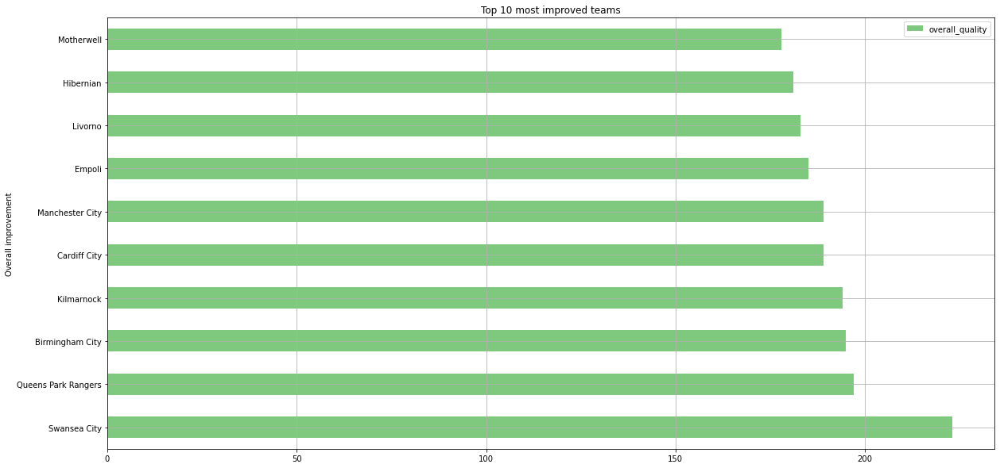

In [27]:
improvement.overall_quality.plot(kind='barh', figsize=(20,10),\
     title='Top 10 most improved teams', xlabel='Overall improvement', legend=True, grid=True, colormap='Accent');

In [28]:
top_10 = improvement.index.to_list()
print('The Top 10 most improved teams are:',top_10)

The Top 10 most improved teams are: ['Swansea City', 'Queens Park Rangers', 'Birmingham City', 'Kilmarnock', 'Cardiff City', 'Manchester City', 'Empoli', 'Livorno', 'Hibernian', 'Motherwell']


## So the first question is clearly answered as the Top 10 most improved teams are: 
['Swansea City', 'Queens Park Rangers', 'Birmingham City', 'Kilmarnock', 'Cardiff City', 'Manchester City', 'Empoli', 'Livorno', 'Hibernian', 'Motherwell']


<a id='q2'></a>
### 2- Which players had the most penalties?

- The all_players dataframe is prepared for this question and has only two columns: player_name & penalties
- We sort the dataframe based on penalties and select the top 10

In [29]:
top_penalties = all_players.sort_values(by='penalties', ascending=False).head(10)
top_penalties

,player_name,penalties
149591,Rickie Lambert,96.0
180726,Xavi Hernandez,95.0
140506,Paul Scholes,95.0
149595,Rickie Lambert,95.0
12015,Andrea Pirlo,95.0
113521,Mario Balotelli,95.0
40643,David Trezeguet,94.0
138696,Paolo Maldini,94.0
53197,Fabio Cannavaro,94.0
27353,Cesc Fabregas,94.0


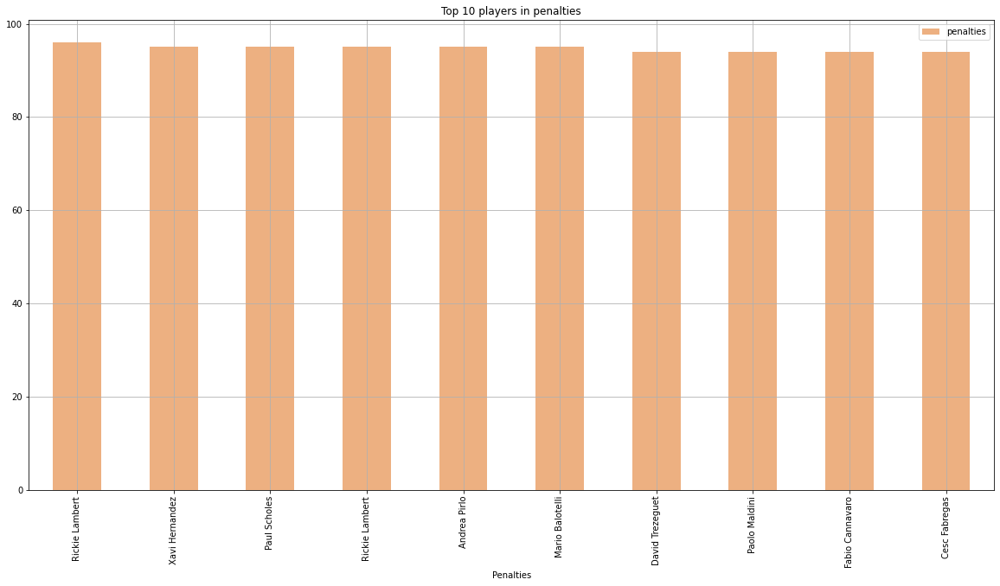

In [30]:
top_penalties.plot(kind='bar', figsize=(20,10), x ='player_name', y='penalties', \
     title='Top 10 players in penalties', xlabel='Penalties', legend=True, grid=True, colormap='flare');

In [31]:
print('The Top player in penalties is:', top_penalties.player_name.to_list()[0])

The Top player in penalties is: Rickie Lambert


As shown from the table, the Top player in penalties is: Rickie Lambert


<a id='q3'></a>
### 3- What team attributes lead to the most victories?

- Convert date column to year in all_teams and all_matches dataframes
- Create a new column in all_matches containing the name of the winner team
- Join teams and matches dataframes based on team names and years to get attributes of winner teams
- Get the means of all winners attributes
- Explore the winners attributes and get the highest attributes of winners 

In [32]:
# Convert date column to year in all_teams and all_matches dataframes
teams_numeric['date'] = pd.DatetimeIndex(teams_numeric['date']).year
all_matches['date'] = pd.DatetimeIndex(all_matches['date']).year

all_matches.head()

,league_name,country_name,season,stage,date,match_api_id,home_team_name,away_team_name,home_team_goal,away_team_goal
0,Belgium Jupiler League,Belgium,2008/2009,1,2008,492473,KRC Genk,Beerschot AC,1,1
1,Belgium Jupiler League,Belgium,2009/2010,5,2009,665353,KRC Genk,Beerschot AC,1,1
2,Belgium Jupiler League,Belgium,2010/2011,1,2010,838476,KRC Genk,Beerschot AC,2,1
3,Belgium Jupiler League,Belgium,2011/2012,1,2011,1032694,KRC Genk,Beerschot AC,3,1
4,Belgium Jupiler League,Belgium,2012/2013,11,2012,1224064,KRC Genk,Beerschot AC,3,0


In [33]:
# Create a new column in all_matches containing the name of the winner team

all_matches['goals'] = all_matches['home_team_goal'] - all_matches['away_team_goal']
home_w = all_matches[all_matches['goals']>0]
home_w = home_w[['date', 'home_team_name', 'match_api_id', 'goals']]
home_w.columns = ['date', 'team_long_name', 'match_api_id', 'goals']

away_w = all_matches[all_matches['goals']<0]
away_w = away_w[['date', 'home_team_name', 'match_api_id', 'goals']]
away_w.columns = ['date', 'team_long_name', 'match_api_id', 'goals']

winners = pd.concat([home_w,away_w])
winners['goals'] = winners['goals'].abs()
winners.head()


,date,team_long_name,match_api_id,goals
2,2010,KRC Genk,838476,1
3,2011,KRC Genk,1032694,2
4,2012,KRC Genk,1224064,3
6,2009,SV Zulte-Waregem,665429,4
7,2010,SV Zulte-Waregem,838560,1


In [34]:
# Join teams and matches dataframes based on team names and years to get attributes of winner teams
winners_attr = pd.merge(winners, teams_numeric, on=['team_long_name', 'date']).drop(columns=['overall_quality','match_api_id','date'])
winners_attr.head()


,team_long_name,goals,buildUpPlaySpeed,buildUpPlayPassing,chanceCreationPassing,chanceCreationCrossing,chanceCreationShooting,defencePressure,defenceAggression,defenceTeamWidth
0,KRC Genk,1,45,45,50,35,60,70,65,70
1,KRC Genk,3,45,45,50,35,60,70,65,70
2,KRC Genk,5,45,45,50,35,60,70,65,70
3,KRC Genk,3,45,45,50,35,60,70,65,70
4,KRC Genk,2,45,45,50,35,60,70,65,70


### Plot heatmap to show the relation between all atributes and number of goals

<AxesSubplot:>

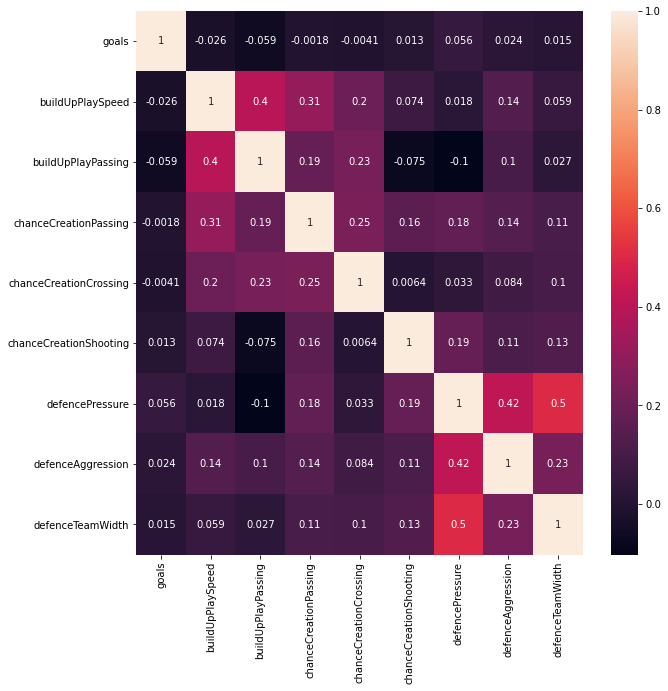

In [35]:
corr = winners_attr.iloc[:,1:].corr()
plt.figure(figsize=(10,10))
sns.heatmap(corr, annot=True)

In [36]:
# Get the means of all winners attributes
attr = winners_attr.drop(columns=['goals']).mean().sort_values(ascending=False)
attr

chanceCreationShooting    54.322597
chanceCreationCrossing    54.087711
buildUpPlaySpeed          52.558898
chanceCreationPassing     52.485842
defenceTeamWidth          52.310350
defenceAggression         49.582755
buildUpPlayPassing        47.787342
defencePressure           46.631177
dtype: float64

### Plot scatter plots between number of goals and each attribute

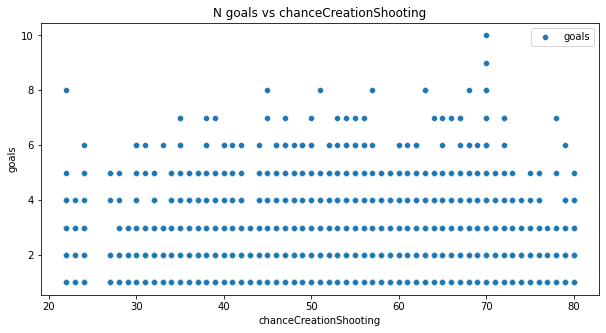

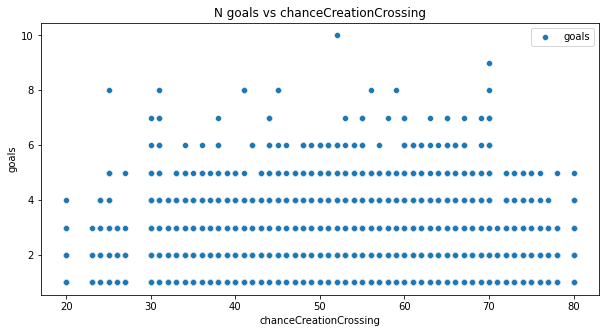

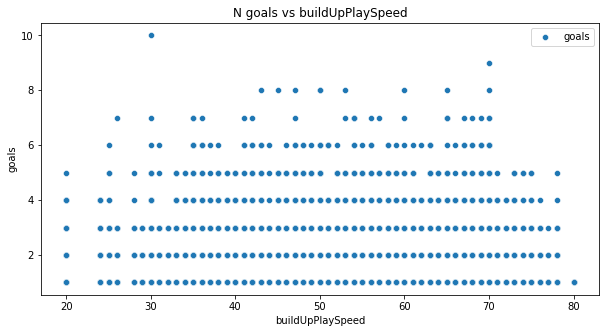

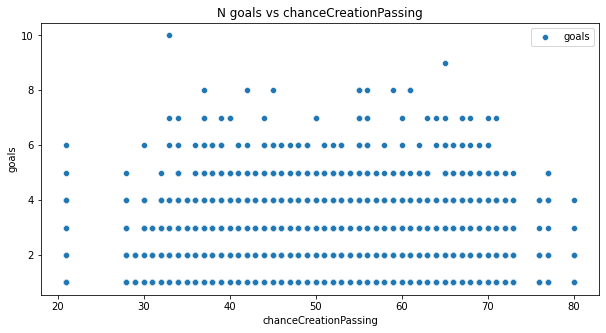

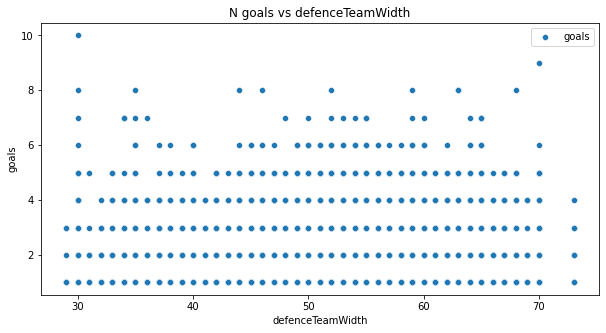

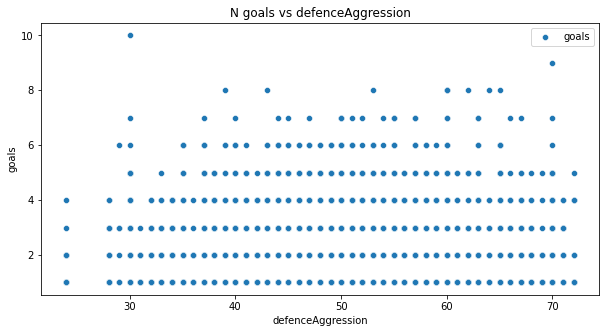

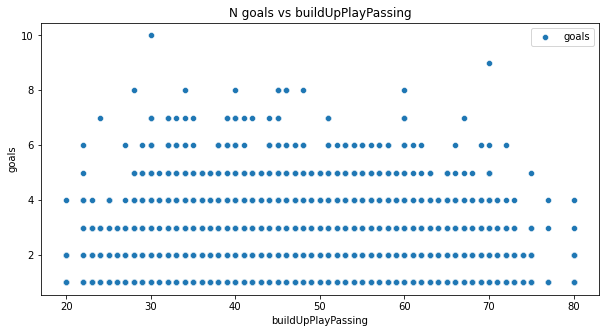

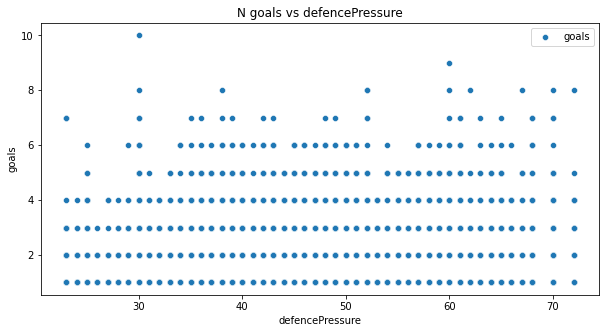

In [40]:
for i in attr.index:
    plt.figure(figsize=(10,5))
    sns.scatterplot(data=winners_attr, y='goals', x=i)
    plt.title('N goals vs '+i)
    plt.legend(['goals'])
    plt.show()

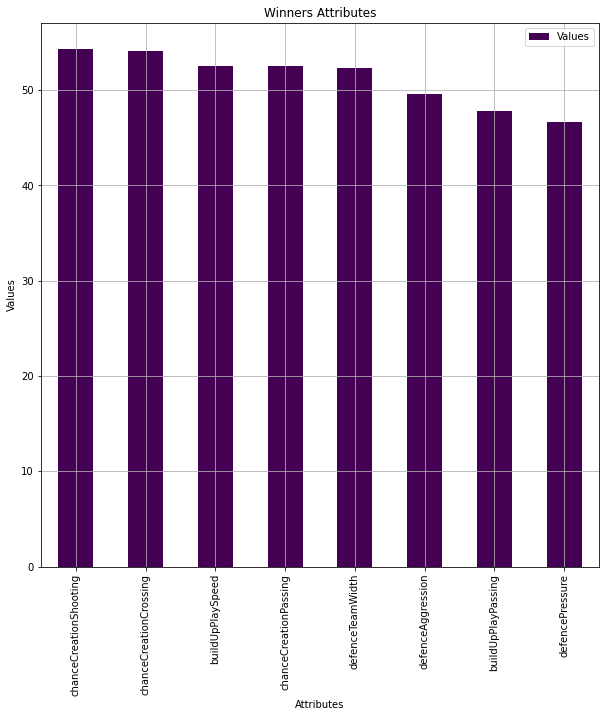

In [38]:
df = pd.DataFrame({"Attributes" : attr.index, "Values" : attr.values})
df.plot(kind='bar', figsize=(10,10), x ='Attributes', y='Values', \
     title='Winners Attributes', xlabel='Attributes', ylabel='Values', legend=True, grid=True, colormap='viridis');

In [128]:
print('The most important attributes for winning are:', attr.index.to_list()[:3])

The most important attributes for winning are: ['chanceCreationShooting', 'chanceCreationCrossing', 'buildUpPlaySpeed']


As we see from the charts, the most important attributes for winning are: ['chanceCreationShooting', 'chanceCreationCrossing', 'buildUpPlaySpeed']

<a id='conclusions'></a>
## Conclusions

- The Top 10 most improved teams are: ['Swansea City', 'Queens Park Rangers', 'Birmingham City', 'Kilmarnock', 'Cardiff City', 'Manchester City', 'Empoli', 'Livorno', 'Hibernian', 'Motherwell']

- The Top player in penalties is: Rickie Lambert

- The most important attributes for winning are: ['chanceCreationShooting', 'chanceCreationCrossing', 'buildUpPlaySpeed']

### Some limitations:

- The database is big and very heavy on the machine to load.

- Some tables like Match table has many unuseful columns (betting records) and some colums has many null values.

- The tables of the database are seperated and it took me a long time to join them correctly.

- The players tables data is not sufficient to get the number of penalties for the players, it only gives an evaluation of the penalty shooting quality of the player.